<a href="https://colab.research.google.com/github/sethkipsangmutuba/Comp-Graphics-Animation/blob/main/CBD3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Raster Images

##Seth Kipsang

A raster image is a digital image composed of a rectangular grid of tiny picture elements called **pixels**. Each pixel stores color information, usually using the **RGB (Red, Green, Blue)** color model. Together, the pixels form the complete image displayed on devices such as computer monitors, televisions, printers, digital cameras, and scanners.

Raster images are stored in memory as a **two-dimensional (2D) array of pixel values**, making them suitable for image processing and computer graphics. Because raster images are **resolution-dependent**, enlarging them may cause **pixelation**. Unlike vector images, raster images represent images using pixels rather than mathematical shapes.



## Raster Images

- **3.1 Raster Devices**
- **3.2 Images, Pixels, and Geometry**
- **3.3 RGB Color**  
- **3.4 Alpha Compositing**

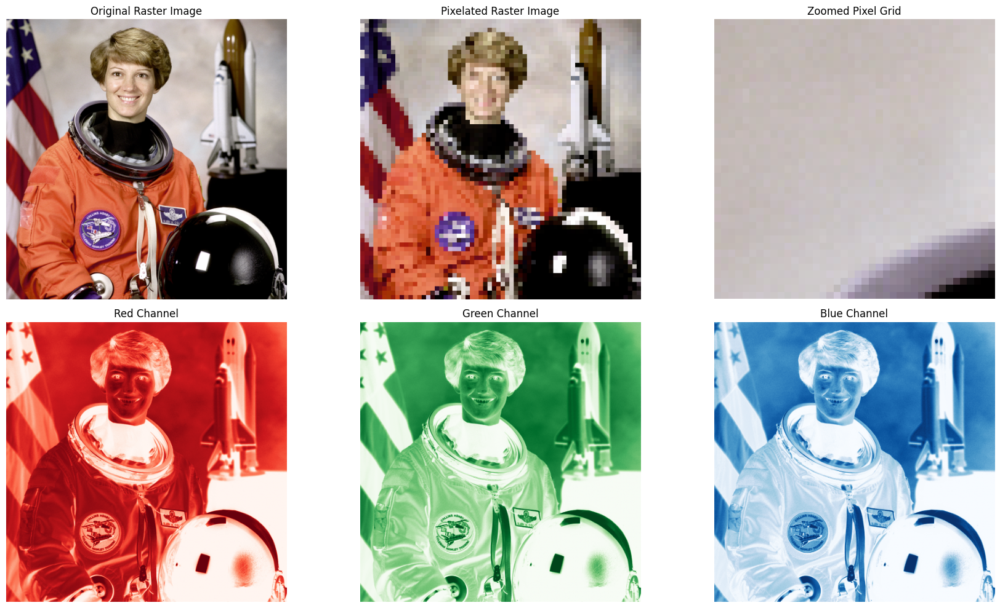

RASTER IMAGE PROPERTIES
Dimensions      : 512 × 512 pixels
Color Channels  : 3
Array Shape     : (512, 512, 3)
Data Type       : uint8
Memory Usage    : 786,432 bytes
Total Pixels    : 262,144
Sample Pixel    : [187 176 169]


In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# Load a built-in raster image
image = data.astronaut()

# Image properties
height, width, channels = image.shape

# Create a pixelated version
factor = 8
small = image[::factor, ::factor]
pixelated = np.repeat(np.repeat(small, factor, axis=0), factor, axis=1)
pixelated = pixelated[:height, :width]

# RGB channels
red = image[:, :, 0]
green = image[:, :, 1]
blue = image[:, :, 2]

# Display (3 subplots per row)
fig, ax = plt.subplots(2, 3, figsize=(18, 10))

# Original Raster Image
ax[0, 0].imshow(image)
ax[0, 0].set_title("Original Raster Image")
ax[0, 0].axis("off")

# Pixelated Raster Image
ax[0, 1].imshow(pixelated)
ax[0, 1].set_title("Pixelated Raster Image")
ax[0, 1].axis("off")

# Pixel Grid (Zoomed View)
zoom = image[120:160, 120:160]
zoom = np.repeat(np.repeat(zoom, 10, axis=0), 10, axis=1)

ax[0, 2].imshow(zoom, interpolation="nearest")
ax[0, 2].set_title("Zoomed Pixel Grid")
ax[0, 2].axis("off")

# Red Channel
ax[1, 0].imshow(red, cmap="Reds")
ax[1, 0].set_title("Red Channel")
ax[1, 0].axis("off")

# Green Channel
ax[1, 1].imshow(green, cmap="Greens")
ax[1, 1].set_title("Green Channel")
ax[1, 1].axis("off")

# Blue Channel
ax[1, 2].imshow(blue, cmap="Blues")
ax[1, 2].set_title("Blue Channel")
ax[1, 2].axis("off")

plt.tight_layout()
plt.show()

# Image Information
print("=" * 60)
print("RASTER IMAGE PROPERTIES")
print("=" * 60)
print(f"Dimensions      : {height} × {width} pixels")
print(f"Color Channels  : {channels}")
print(f"Array Shape     : {image.shape}")
print(f"Data Type       : {image.dtype}")
print(f"Memory Usage    : {image.nbytes:,} bytes")
print(f"Total Pixels    : {height * width:,}")
print(f"Sample Pixel    : {image[100, 100]}")
print("=" * 60)

## 3.1 Raster Devices

### Definition

Raster devices are input and output devices that create, display, print, or capture images using a rectangular grid of pixels. They form the foundation of modern computer graphics systems.

---

### Classification of Raster Devices

#### 1. Output Devices

Output devices display or produce raster images.

##### a) Display Devices

- **Transmissive Displays**: Liquid Crystal Display (LCD)  
- **Emissive Displays**: Light-Emitting Diode (LED) Display  

##### b) Hardcopy Devices

- **Binary Printers**: Inkjet Printers  
- **Continuous-Tone Printers**: Dye Sublimation Printers  

---

#### 2. Input Devices

Input devices capture raster images.

- **2D Array Sensor**: Digital Camera  
- **1D Array Sensor**: Flatbed Scanner  

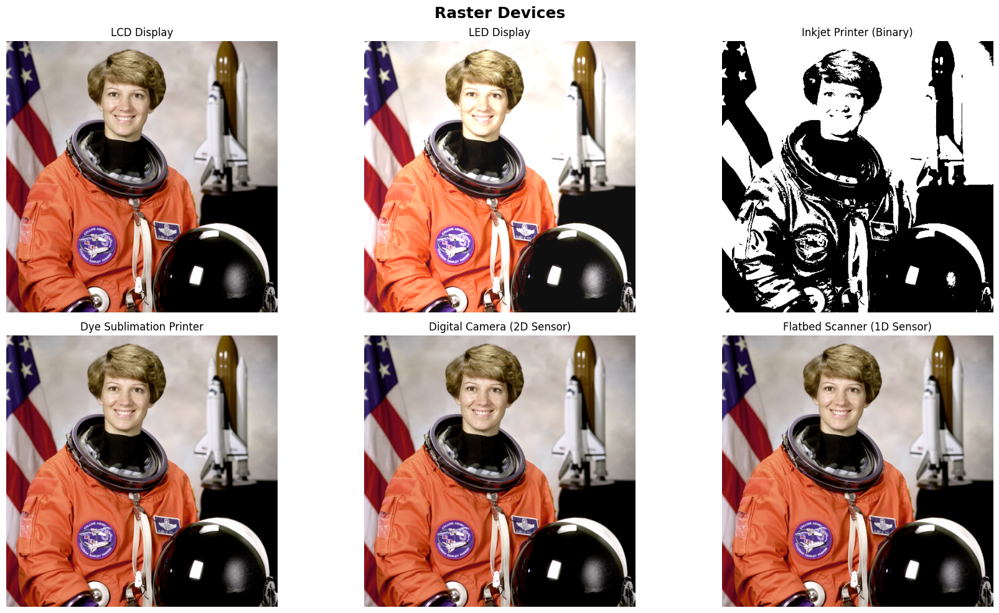

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, color

# Built-in raster image (simulates a scene captured by a camera)
image = data.astronaut()

# LCD Display (Original Image)
lcd = image.copy()

# LED Display (Higher Brightness and Contrast)
led = np.clip(image * 1.25 + 15, 0, 255).astype(np.uint8)

# Inkjet Printer (Binary/Dithered Approximation)
gray = color.rgb2gray(image)
inkjet = (gray > 0.5).astype(np.uint8) * 255

# Dye Sublimation Printer (Continuous Tone)
dye = image.copy()

# Digital Camera (2D Sensor)
camera_sensor = image.copy()

# Flatbed Scanner (1D Line Sensor Simulation)
scanner = np.zeros_like(image)

for row in range(image.shape[0]):
    scanner[row] = image[row]


# Display (3 Subplots Per Row)
fig, ax = plt.subplots(2, 3, figsize=(18, 10))

ax[0,0].imshow(lcd)
ax[0,0].set_title("LCD Display")
ax[0,0].axis("off")

ax[0,1].imshow(led)
ax[0,1].set_title("LED Display")
ax[0,1].axis("off")

ax[0,2].imshow(inkjet, cmap="gray")
ax[0,2].set_title("Inkjet Printer (Binary)")
ax[0,2].axis("off")

ax[1,0].imshow(dye)
ax[1,0].set_title("Dye Sublimation Printer")
ax[1,0].axis("off")

ax[1,1].imshow(camera_sensor)
ax[1,1].set_title("Digital Camera (2D Sensor)")
ax[1,1].axis("off")

ax[1,2].imshow(scanner)
ax[1,2].set_title("Flatbed Scanner (1D Sensor)")
ax[1,2].axis("off")

plt.suptitle("Raster Devices", fontsize=18, fontweight="bold")
plt.tight_layout()
plt.show()

## 3.1.1 Displays

### Definition

A display is an output device that presents digital images using a fixed array of pixels. Each pixel can be controlled individually to produce the desired image.

---

### Types of Displays

#### 1. Emissive Displays

- Pixels generate their own light.  
- No external light source is required.  
- **Example**: LED Display  

#### 2. Transmissive Displays

- Pixels do not emit light.  
- Require a backlight or projector lamp.  
- **Example**: LCD Display  

---

## LED (Light-Emitting Diode) Displays

### Definition

An LED display is an emissive display in which each pixel contains tiny LEDs that emit light when an electric current passes through them.

### Characteristics

- Emits its own light  
- Uses Red, Green, and Blue (RGB) subpixels  
- Produces bright, high-contrast images  
- Energy-efficient with fast response times  

---

## LCD (Liquid Crystal Display)

### Definition

An LCD is a transmissive display that controls the amount of light passing through liquid crystals using an applied voltage.

### Working Principle

- A backlight provides illumination  
- Liquid crystals rotate polarized light  
- Polarizing filters control the transmitted light intensity  
- RGB color filters create full-color images  

### Characteristics

- Requires a backlight  
- Low power consumption  
- Thin and lightweight  
- Common in laptops, monitors, and televisions  

---

## Display Resolution

### Definition

Resolution is the number of pixels arranged horizontally and vertically on a display.

### Example

- **1920 × 1200 pixels**  
- Total pixels = **2,304,000**

Higher resolutions provide greater image detail and clarity.

---

## Key Points

- Raster devices use a grid of pixels to create or capture images  
- Raster devices are classified as input or output devices  
- LED displays are emissive and produce their own light  
- LCD displays are transmissive and require a backlight  
- Display quality depends on the resolution (number of pixels)  

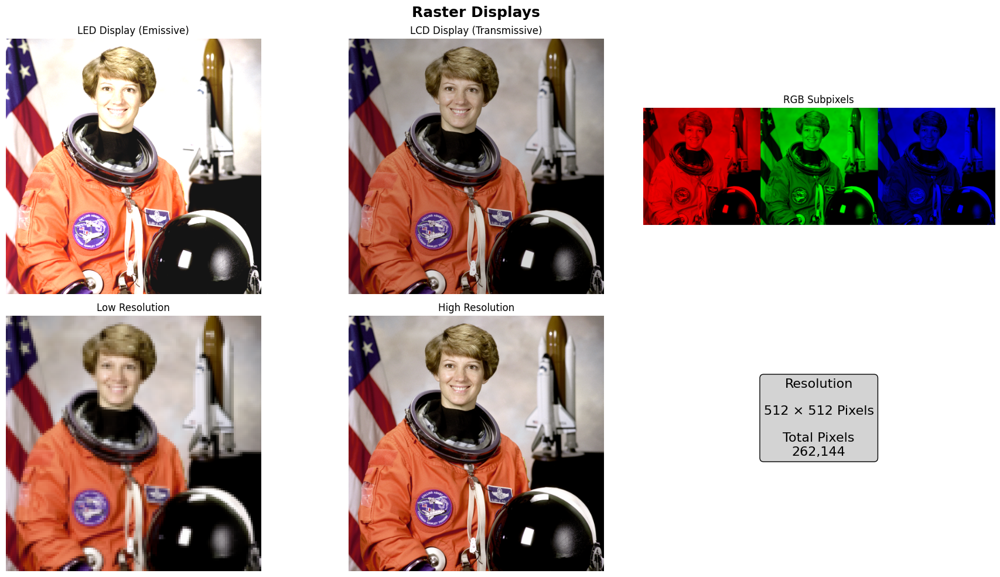

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, transform

# Built-in raster image
image = data.astronaut()

# Emissive Display (LED)
# Higher brightness and contrast
# ----------------------------------------------------------

led = np.clip(image * 1.35 + 20, 0, 255).astype(np.uint8)

# Transmissive Display (LCD)
# Slightly lower brightness to simulate backlight dependence
# ----------------------------------------------------------

lcd = np.clip(image * 0.85, 0, 255).astype(np.uint8)

# RGB Subpixels
red = np.zeros_like(image)
green = np.zeros_like(image)
blue = np.zeros_like(image)

red[:, :, 0] = image[:, :, 0]
green[:, :, 1] = image[:, :, 1]
blue[:, :, 2] = image[:, :, 2]

# Resolution Comparison
low_resolution = transform.resize(
    image,
    (120, 120),
    anti_aliasing=True,
    preserve_range=True
).astype(np.uint8)

low_resolution = transform.resize(
    low_resolution,
    image.shape,
    order=0,
    preserve_range=True,
    anti_aliasing=False
).astype(np.uint8)

high_resolution = image.copy()

# Display
fig, ax = plt.subplots(2, 3, figsize=(18, 10))

# LED Display
ax[0,0].imshow(led)
ax[0,0].set_title("LED Display (Emissive)")
ax[0,0].axis("off")

# LCD Display
ax[0,1].imshow(lcd)
ax[0,1].set_title("LCD Display (Transmissive)")
ax[0,1].axis("off")

# RGB Subpixels
rgb_channels = np.hstack((red, green, blue))
ax[0,2].imshow(rgb_channels)
ax[0,2].set_title("RGB Subpixels")
ax[0,2].axis("off")

# Low Resolution
ax[1,0].imshow(low_resolution)
ax[1,0].set_title("Low Resolution")
ax[1,0].axis("off")

# High Resolution
ax[1,1].imshow(high_resolution)
ax[1,1].set_title("High Resolution")
ax[1,1].axis("off")

# Resolution Information
ax[1,2].axis("off")
ax[1,2].text(
    0.5,
    0.60,
    f"Resolution\n\n"
    f"{image.shape[1]} × {image.shape[0]} Pixels\n\n"
    f"Total Pixels\n"
    f"{image.shape[0]*image.shape[1]:,}",
    ha="center",
    va="center",
    fontsize=16,
    bbox=dict(boxstyle="round", facecolor="lightgray")
)

plt.suptitle(
    "Raster Displays",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 3.1.2 Hardcopy Devices

### Definition

Hardcopy devices are output devices that produce permanent images on paper or other printing media. They create raster images by depositing pigments or dyes to reproduce digital images.

---

### Types of Hardcopy Devices

#### 1. Inkjet Printer (Binary Printer)

### Definition

An inkjet printer produces images by spraying tiny droplets of ink onto paper in a raster pattern.

### Working Principle

- The print head moves across the paper  
- Ink droplets are deposited only where required  
- The paper advances after each pass until the image is complete  
- Color printing uses multiple ink cartridges (e.g., Cyan, Magenta, Yellow, and Black)  

### Characteristics

- Prints binary images (ink deposited or not deposited)  
- No physical pixel grid  
- Resolution is measured in dots per inch (dpi)  
- Common for home and office printing  

---

#### 2. Thermal Dye Transfer Printer (Continuous-Tone Printer)

### Definition

A thermal dye transfer printer produces images by transferring controlled amounts of dye from a ribbon onto paper using heat.

### Working Principle

- Heating elements warm selected areas of the dye ribbon  
- The heated dye transfers onto the paper  
- Different temperatures transfer different amounts of dye, producing smooth color variations  

### Characteristics

- Produces continuous-tone images  
- Generates high-quality photographs  
- Resolution is measured in pixels per inch (ppi)  
- Provides smooth color gradients  

---

## Printer Resolution

### Definition

Printer resolution is the number of dots or pixels printed per inch, which determines print quality.

- Inkjet printers: Measured in **Dots Per Inch (dpi)**  
- Thermal dye transfer printers: Measured in **Pixels Per Inch (ppi)**  

Higher resolution produces sharper text, smoother edges, and more detailed images.

---

## Key Points

- Hardcopy devices produce permanent raster images on paper  
- Inkjet printers are binary devices that print using ink droplets  
- Thermal dye transfer printers are continuous-tone devices that use heat to transfer dye  
- Printer quality depends on resolution, measured in dpi or ppi  

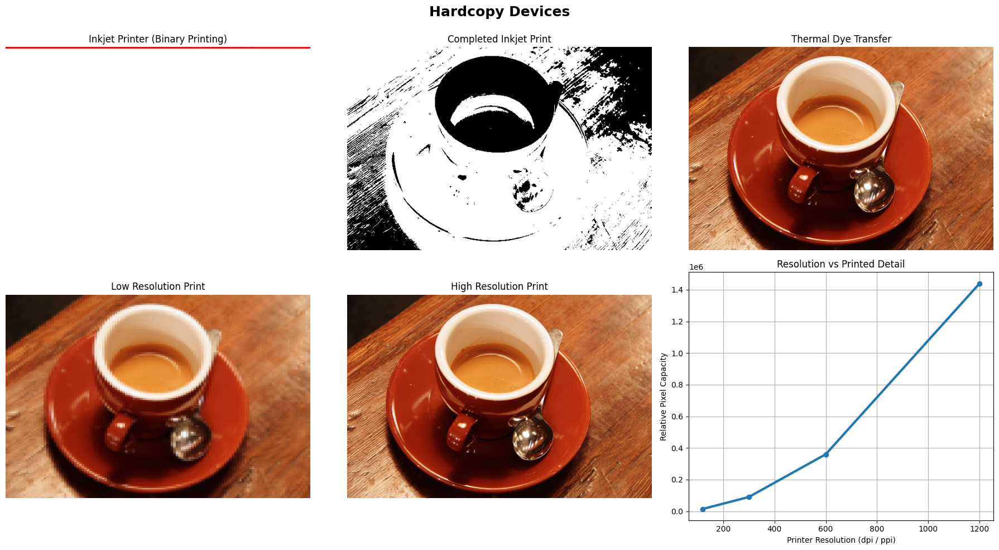

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from skimage import data, color, transform

# Load Built-in Image
image = data.coffee()

# Inkjet Printer (Binary Printing)
gray = color.rgb2gray(image)
binary = gray < 0.5          # Ink deposited (1) or not (0)

paper = np.ones_like(gray)

# Thermal Dye Transfer (Continuous Tone)
thermal = image.copy()

# Resolution Demonstration
low_resolution = transform.resize(
    image,
    (120,120),
    preserve_range=True,
    anti_aliasing=True
).astype(np.uint8)

low_resolution = transform.resize(
    low_resolution,
    image.shape,
    preserve_range=True,
    order=0,
    anti_aliasing=False
).astype(np.uint8)

high_resolution = image.copy()

# Figure
fig, ax = plt.subplots(2,3,figsize=(18,10))

# Binary Printing Animation
binary_plot = ax[0,0].imshow(
    paper,
    cmap="gray",
    vmin=0,
    vmax=1,
    interpolation="nearest"
)
scan_line = ax[0,0].axhline(0,color="red",lw=2)

ax[0,0].set_title("Inkjet Printer (Binary Printing)")
ax[0,0].axis("off")

# Final Binary Print
ax[0,1].imshow(binary,cmap="gray")
ax[0,1].set_title("Completed Inkjet Print")
ax[0,1].axis("off")

# Continuous Tone Printer
ax[0,2].imshow(thermal)
ax[0,2].set_title("Thermal Dye Transfer")
ax[0,2].axis("off")

# Low DPI
ax[1,0].imshow(low_resolution)
ax[1,0].set_title("Low Resolution Print")
ax[1,0].axis("off")

# High DPI
ax[1,1].imshow(high_resolution)
ax[1,1].set_title("High Resolution Print")
ax[1,1].axis("off")

# Resolution Comparison
ax[1,2].plot(
    [120,300,600,1200],
    [120*120,300*300,600*600,1200*1200],
    marker="o",
    linewidth=3
)

ax[1,2].set_title("Resolution vs Printed Detail")
ax[1,2].set_xlabel("Printer Resolution (dpi / ppi)")
ax[1,2].set_ylabel("Relative Pixel Capacity")
ax[1,2].grid(True)

plt.suptitle(
    "Hardcopy Devices",
    fontsize=18,
    fontweight="bold"
)


# Inkjet Printing Animation
def update(row):

    paper[row] = np.where(binary[row],0,1)

    binary_plot.set_data(paper)

    scan_line.set_ydata([row,row])

    return binary_plot, scan_line

animation = FuncAnimation(
    fig,
    update,
    frames=paper.shape[0],
    interval=10,
    repeat=False,
    blit=True
)

plt.tight_layout()
plt.show()

## 3.1.3 Input Devices

### Definition

Input devices are raster devices that capture real-world images and convert them into digital raster images by measuring light at each pixel.

---

### Types of Input Devices

#### 1. Digital Camera (2D Array Sensor)

##### Definition

A digital camera captures images using a two-dimensional (2D) array of light-sensitive pixels called an image sensor.

##### Working Principle

- A camera lens focuses light onto the image sensor  
- Each sensor pixel measures the intensity of incoming light  
- Color images are produced using Red, Green, and Blue (RGB) filters  
- The measured values form a digital raster image  

##### Characteristics

- Uses CCD or CMOS image sensors  
- Resolution is measured in megapixels (MP)  
- Widely used in smartphones, digital cameras, and surveillance systems  

---

#### 2. Flatbed Scanner (1D Array Sensor)

##### Definition

A flatbed scanner captures images using a one-dimensional (1D) sensor array that moves across the document.

##### Working Principle

- The scan head moves line by line across the document  
- RGB sensors measure the color of each point  
- The measurements are combined to form a raster image  

##### Characteristics

- Produces high-quality digital copies of documents and photographs  
- Resolution is measured in pixels per inch (ppi)  
- Commonly used for document and image digitization  

---

## Resolution of Input Devices

### Definition

The resolution of an input device is the number of pixels used to capture an image.

- Digital cameras: Resolution is measured in **megapixels (MP)**  
- Scanners: Resolution is measured in **pixels per inch (ppi)**  

Higher resolution captures more image detail.

---

## Key Points

- Input devices convert real-world scenes into digital raster images  
- Digital cameras use 2D image sensors to capture photographs  
- Flatbed scanners use 1D sensor arrays to scan documents line by line  
- Image quality depends on the resolution of the input device  

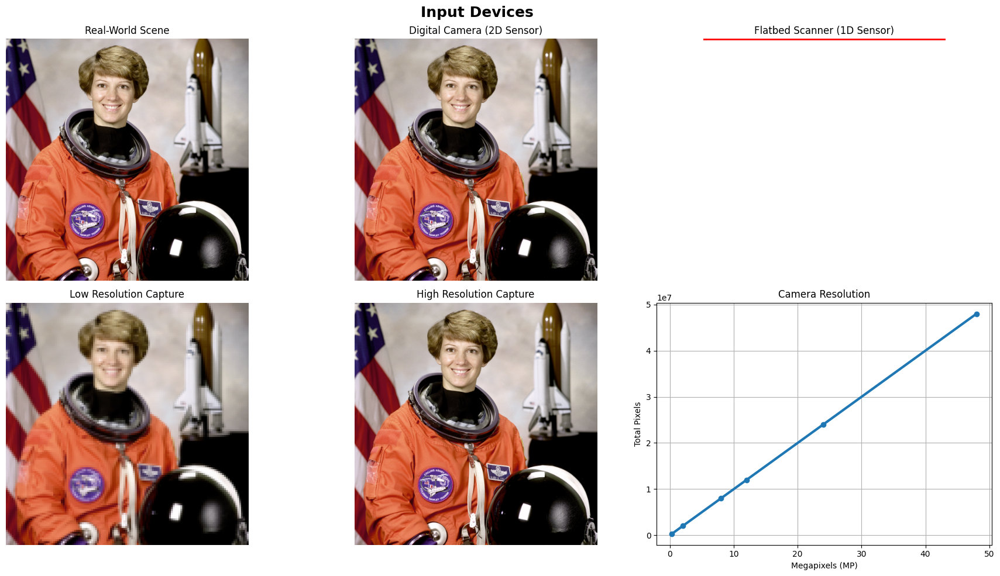

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from skimage import data, transform

# Real-World Scene
scene = data.astronaut()
height, width, _ = scene.shape

# Digital Camera (2D Image Sensor)
# Entire sensor captures the scene simultaneously
#---------------------------------------------------------

camera_capture = scene.copy()

# Flatbed Scanner (1D Line Sensor)
scanner_capture = np.ones_like(scene) * 255

# Resolution Comparison
low_resolution = transform.resize(
    scene,
    (128, 128),
    preserve_range=True,
    anti_aliasing=True
).astype(np.uint8)

low_resolution = transform.resize(
    low_resolution,
    scene.shape,
    order=0,
    preserve_range=True,
    anti_aliasing=False
).astype(np.uint8)

high_resolution = scene.copy()

# Figure
fig, ax = plt.subplots(2, 3, figsize=(18, 10))

# Original Scene
ax[0,0].imshow(scene)
ax[0,0].set_title("Real-World Scene")
ax[0,0].axis("off")

# Digital Camera Capture
ax[0,1].imshow(camera_capture)
ax[0,1].set_title("Digital Camera (2D Sensor)")
ax[0,1].axis("off")

# Flatbed Scanner (Animated)
scanner_plot = ax[0,2].imshow(scanner_capture)
scan_line = ax[0,2].axhline(0, color="red", linewidth=2)
ax[0,2].set_title("Flatbed Scanner (1D Sensor)")
ax[0,2].axis("off")

# Low Resolution Capture
ax[1,0].imshow(low_resolution)
ax[1,0].set_title("Low Resolution Capture")
ax[1,0].axis("off")

# High Resolution Capture
ax[1,1].imshow(high_resolution)
ax[1,1].set_title("High Resolution Capture")
ax[1,1].axis("off")

# Resolution Comparison
megapixels = np.array([0.3, 2, 8, 12, 24, 48])
pixels = megapixels * 1_000_000

ax[1,2].plot(megapixels, pixels, marker="o", linewidth=3)
ax[1,2].set_title("Camera Resolution")
ax[1,2].set_xlabel("Megapixels (MP)")
ax[1,2].set_ylabel("Total Pixels")
ax[1,2].grid(True)

plt.suptitle(
    "Input Devices",
    fontsize=18,
    fontweight="bold"
)

# Scanner Simulation
def update(row):

    scanner_capture[row] = scene[row]

    scanner_plot.set_data(scanner_capture)

    scan_line.set_ydata([row, row])

    return scanner_plot, scan_line

animation = FuncAnimation(
    fig,
    update,
    frames=height,
    interval=8,
    repeat=False,
    blit=True
)

plt.tight_layout()
plt.show()

## 3.2 Images, Pixels, and Geometry

### Definition

An image is a two-dimensional (2D) representation of visual information, while a raster image stores this information as a grid of pixels. Each pixel contains the color or brightness of a small region of the image.

---

## Image Representation

A raster image is stored as a **2D array (matrix) of pixels**.

- Each pixel stores brightness (grayscale) or color (RGB)  
- Together, all pixels form the complete digital image  
- Images are represented independently of the display or input device  

---

## Pixels as Samples

### Definition

A pixel is a sample of the image at a specific location. Rather than representing a tiny square, a pixel stores the average color or intensity of a small area of the image.

### Characteristics

- Each pixel represents local image information  
- Pixel values are obtained by sampling light from a scene  
- The collection of sampled pixels forms the raster image  

---

## Image Geometry

### Definition

Image geometry describes how pixels are arranged and positioned within an image.

---

### Pixel Coordinates

- Pixels are arranged in rows and columns  
- The bottom-left pixel is assigned coordinates **(0, 0)**  
- The top-right pixel is **(nx − 1, ny − 1)**, where:  
  - **nx** = number of columns  
  - **ny** = number of rows  

---

## Image Domain

The image occupies a rectangular area extending half a pixel beyond the outermost pixels, providing a consistent coordinate system for graphics operations.

---

## Key Points

- An image is represented as a 2D array of pixels  
- A pixel is a sample representing the average color or intensity of a small image region  
- Pixels are organized using row and column coordinates  
- Image geometry provides a consistent framework for graphics processing and rendering  

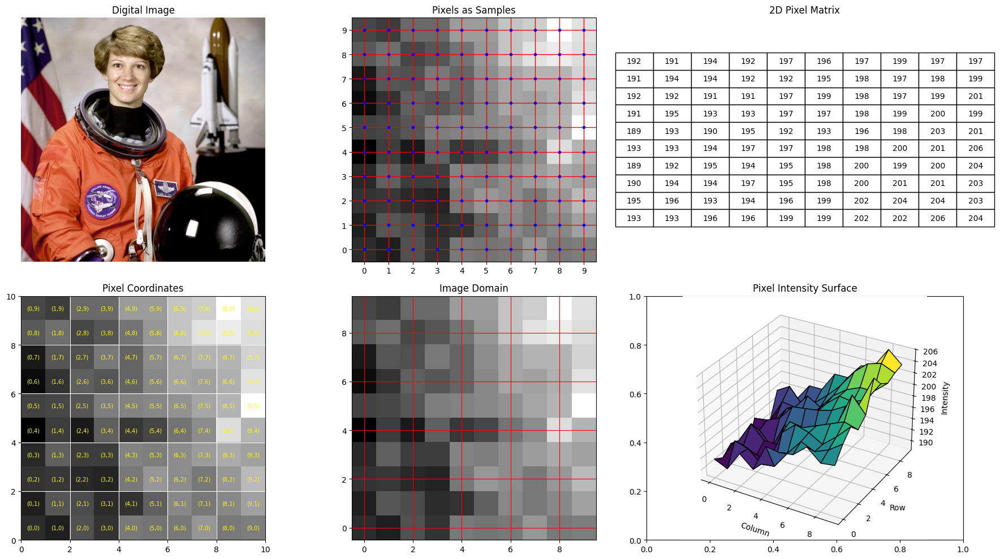

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# Image
image = data.astronaut()

# Convert to grayscale
gray = np.mean(image, axis=2)

# Small image for geometry visualization
sample = gray[120:130, 150:160]
rows, cols = sample.shape

# Figure
fig, ax = plt.subplots(2, 3, figsize=(18, 10))

# Original Image
ax[0,0].imshow(image)
ax[0,0].set_title("Digital Image")
ax[0,0].axis("off")

# Pixel Sampling
ax[0,1].imshow(sample,
               cmap="gray",
               interpolation="nearest",
               extent=[0, cols, 0, rows],
               origin="lower")

ax[0,1].set_title("Pixels as Samples")
ax[0,1].set_xticks(np.arange(cols)+0.5)
ax[0,1].set_yticks(np.arange(rows)+0.5)
ax[0,1].set_xticklabels(np.arange(cols))
ax[0,1].set_yticklabels(np.arange(rows))
ax[0,1].grid(color="red", linewidth=1)

# Sample locations

for y in range(rows):
    for x in range(cols):
        ax[0,1].plot(
            x+0.5,
            y+0.5,
            "bo",
            markersize=3
        )

# Pixel Values
ax[0,2].axis("off")

table = ax[0,2].table(
    cellText=np.round(sample).astype(int),
    loc="center",
    cellLoc="center"
)

table.scale(1.2,1.5)

ax[0,2].set_title("2D Pixel Matrix")

# Image Geometry
ax[1,0].imshow(sample,
               cmap="gray",
               interpolation="nearest",
               extent=[0, cols, 0, rows],
               origin="lower")

ax[1,0].set_title("Pixel Coordinates")

for y in range(rows):
    for x in range(cols):

        ax[1,0].text(
            x+0.5,
            y+0.5,
            f"({x},{y})",
            ha="center",
            va="center",
            fontsize=7,
            color="yellow"
        )

ax[1,0].grid(color="white")

# Image Domain
ax[1,1].imshow(sample,
               cmap="gray",
               interpolation="nearest",
               extent=[-0.5, cols-0.5,
                       -0.5, rows-0.5],
               origin="lower")

ax[1,1].set_title("Image Domain")

ax[1,1].set_xlim(-0.5, cols-0.5)
ax[1,1].set_ylim(-0.5, rows-0.5)

ax[1,1].grid(color="red")

# Pixel Intensity Surface
X,Y=np.meshgrid(
    np.arange(cols),
    np.arange(rows)
)

ax3d = fig.add_subplot(2,3,6,projection="3d")

ax3d.plot_surface(
    X,
    Y,
    sample,
    cmap="viridis",
    edgecolor="k"
)

ax3d.set_title("Pixel Intensity Surface")
ax3d.set_xlabel("Column")
ax3d.set_ylabel("Row")
ax3d.set_zlabel("Intensity")

plt.tight_layout()
plt.show()

## 3.2.1 Pixel Values

### Definition

A pixel value is the numerical information stored in a pixel that represents its brightness (grayscale) or color (RGB). Pixel values determine the appearance and quality of a digital image.

---

## Types of Pixel Values

### 1. Grayscale Pixel Values

- Store a single intensity value  
- Represent brightness from black to white  

### 2. RGB Pixel Values

- Store three values representing Red (R), Green (G), and Blue (B)  
- Combining these values produces different colors  

---

## Pixel Formats

Common pixel formats include:

- **1-bit grayscale**: Black-and-white images  
- **8-bit grayscale**: 256 intensity levels  
- **24-bit RGB (8 bits per color)**: Standard color images  
- **48-bit RGB (16 bits per color)**: Professional photography and printing  
- **32-bit floating-point RGB**: High Dynamic Range (HDR) images and advanced graphics  

---

## Image Dynamic Range

### Low Dynamic Range (LDR)

- Uses fixed-range integer values  
- Common in standard digital images  

### High Dynamic Range (HDR)

- Uses floating-point values  
- Captures a wider range of brightness and color details  

---

## Image Artifacts

Reducing pixel precision may introduce:

- **Clipping**: Bright pixel values exceed the maximum limit and lose detail  
- **Quantization (Banding)**: Limited precision causes visible color or brightness transitions  

---

## Key Points

- Pixel values represent brightness or RGB color  
- Higher bit depth improves image quality and color accuracy  
- LDR images use fixed-range values, while HDR images store a wider range of intensities  
- Low precision may cause clipping and banding artifacts  

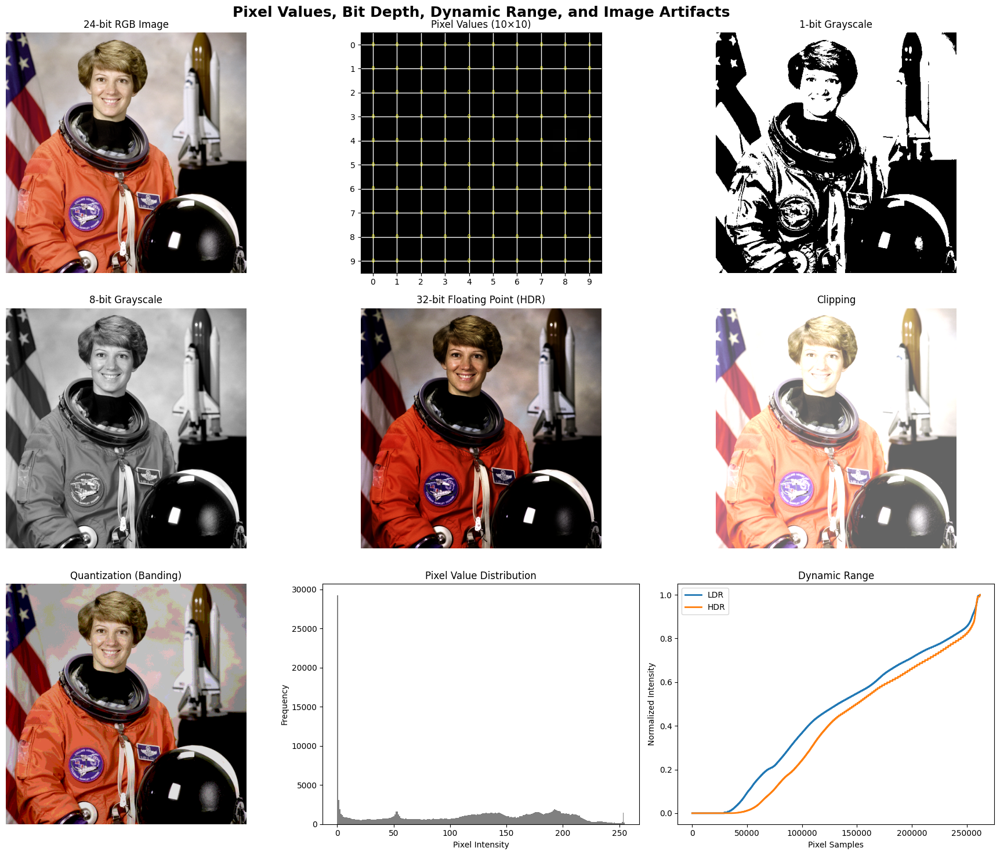

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data, exposure

# Load Built-in Image
image = data.astronaut()

# Pixel Formats
#--------------------------------------------
# 1-bit Grayscale
gray = np.mean(image, axis=2)
binary = (gray > 128).astype(np.uint8)

# 8-bit Grayscale
gray8 = gray.astype(np.uint8)

# 24-bit RGB
rgb24 = image.copy()

# 48-bit RGB (16-bit per channel)
rgb48 = (image.astype(np.uint16) * 257)

# HDR (32-bit Floating Point)
hdr = image.astype(np.float32) / 255.0
hdr = hdr ** 2.2

# Image Artifacts
# ---------------------------------------------

# Clipping
clipped = np.clip(image.astype(np.int16) + 100, 0, 255).astype(np.uint8)

# Quantization (Banding)
levels = 8
banding = np.floor(image / (256 / levels)) * (256 / levels)
banding = banding.astype(np.uint8)

# Pixel Value Distribution
#-----------------------------------------------

sample = image[220:230, 250:260]

# Figure
fig = plt.figure(figsize=(18, 15))

# Original Image
ax1 = plt.subplot(3,3,1)
ax1.imshow(image)
ax1.set_title("24-bit RGB Image")
ax1.axis("off")

# Pixel Matrix
ax2 = plt.subplot(3,3,2)
ax2.imshow(sample, interpolation="nearest")
ax2.set_title("Pixel Values (10×10)")
ax2.set_xticks(np.arange(10))
ax2.set_yticks(np.arange(10))
ax2.grid(color="white", linewidth=1)

for r in range(10):
    for c in range(10):
        R,G,B = sample[r,c]
        ax2.text(
            c,
            r,
            f"{R}",
            ha="center",
            va="center",
            fontsize=6,
            color="yellow"
        )

# Bit Depth Comparison
ax3 = plt.subplot(3,3,3)
ax3.imshow(binary,cmap="gray")
ax3.set_title("1-bit Grayscale")
ax3.axis("off")

# 8-bit Grayscale
ax4 = plt.subplot(3,3,4)
ax4.imshow(gray8,cmap="gray")
ax4.set_title("8-bit Grayscale")
ax4.axis("off")

# HDR
ax5 = plt.subplot(3,3,5)
ax5.imshow(np.clip(hdr,0,1))
ax5.set_title("32-bit Floating Point (HDR)")
ax5.axis("off")

# Clipping Artifact
ax6 = plt.subplot(3,3,6)
ax6.imshow(clipped)
ax6.set_title("Clipping")
ax6.axis("off")

# Quantization (Banding)
ax7 = plt.subplot(3,3,7)
ax7.imshow(banding)
ax7.set_title("Quantization (Banding)")
ax7.axis("off")

# Histogram (Dynamic Range)
ax8 = plt.subplot(3,3,8)

ax8.hist(gray8.ravel(),
         bins=256,
         color="gray")

ax8.set_title("Pixel Value Distribution")
ax8.set_xlabel("Pixel Intensity")
ax8.set_ylabel("Frequency")

# Dynamic Range Mapping
ax9 = plt.subplot(3,3,9)

ldr = gray8 / 255

ax9.plot(
    np.sort(ldr.ravel()),
    label="LDR",
    linewidth=2
)

ax9.plot(
    np.sort(hdr[:,:,0].ravel()),
    label="HDR",
    linewidth=2
)

ax9.set_title("Dynamic Range")
ax9.set_xlabel("Pixel Samples")
ax9.set_ylabel("Normalized Intensity")
ax9.legend()

plt.suptitle(
    "Pixel Values, Bit Depth, Dynamic Range, and Image Artifacts",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 3.2.2 Monitor Intensities and Gamma

### Definition

Monitor intensity is the amount of light emitted by a display for each pixel. The displayed brightness depends on the pixel value and the monitor's gamma (γ), which controls the relationship between input values and output brightness.

---

## Monitor Intensities

- Pixel values range from **0 to 1**  
- **0** represents black (minimum intensity)  
- **1** represents white (maximum intensity)  
- A value of **0.5** does not always produce half the brightness because monitors respond nonlinearly  

---

## Gamma (γ)

### Definition

Gamma (γ) is a measure of a monitor's nonlinear response between the input pixel value and the displayed brightness.

The relationship is given by:

$
\text{Displayed Intensity} = (\text{Input Value})^{\gamma}
$

If **γ = 2.0** and the input value is **0.5**, the displayed intensity becomes **0.25** instead of **0.5**.

---

## Gamma Correction

### Definition

Gamma correction adjusts pixel values before display so that the perceived brightness matches the intended image.

The corrected input is calculated as:


$\text{Corrected Input} = (\text{Input Value})^{1/\gamma}$


---

## Quantization

Modern monitors use **8-bit pixel values**, giving **256 intensity levels (0–255)** for each color channel. This process is called **quantization** and limits the number of brightness levels that can be displayed.

---

## Key Points

- Monitor brightness is nonlinear  
- Gamma (γ) determines how input values are converted to displayed intensity  
- Gamma correction compensates for monitor nonlinearity  
- Most displays use 8-bit quantization (256 intensity levels) for each color channel  

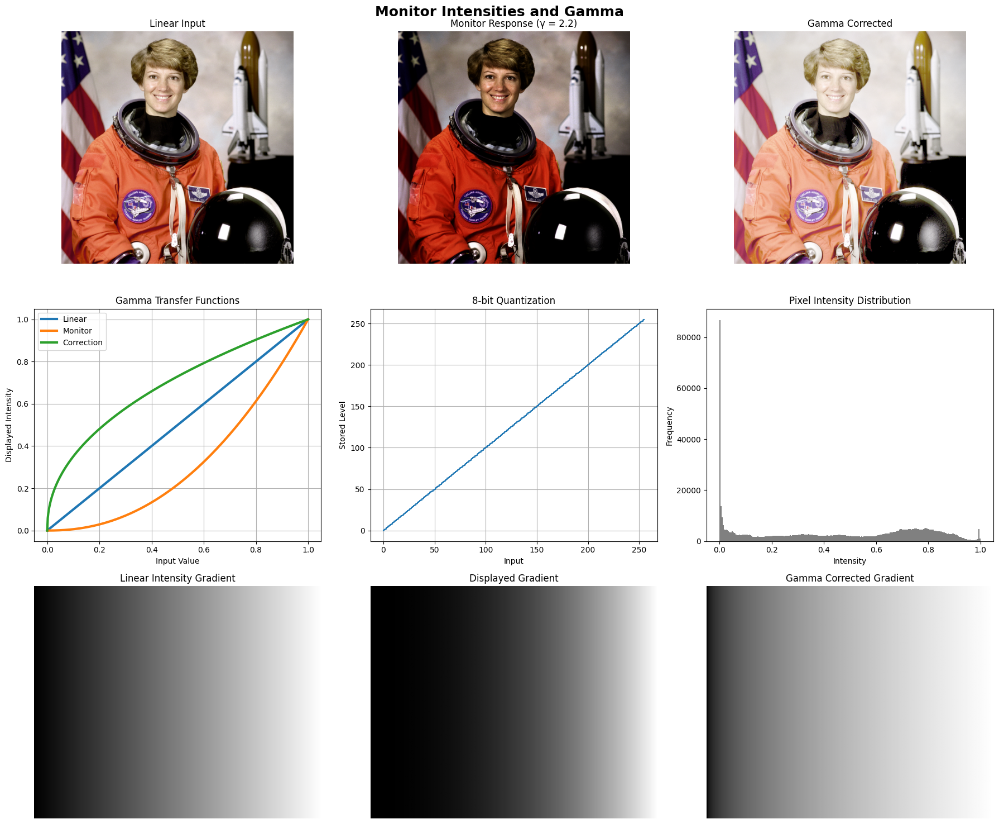

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import data

# Load Built-in Image
image = data.astronaut().astype(np.float32) / 255.0

# Gamma Parameters
gamma = 2.2

# Monitor Response
# Displayed Intensity = Input^γ
# -------------------------------------------------------

monitor = image ** gamma

# Gamma Correction
# Corrected Input = Input^(1/γ)
# ---------------------------------------------------------

corrected = image ** (1 / gamma)

# Quantization (8-bit)
quantized = np.round(image * 255).astype(np.uint8)

# Transfer Function
x = np.linspace(0, 1, 500)

linear = x
gamma_curve = x ** gamma
correction_curve = x ** (1 / gamma)

# Figure
fig = plt.figure(figsize=(18, 15))

# Original Image
ax1 = plt.subplot(3,3,1)
ax1.imshow(image)
ax1.set_title("Linear Input")
ax1.axis("off")

# Monitor Output
ax2 = plt.subplot(3,3,2)
ax2.imshow(monitor)
ax2.set_title(f"Monitor Response (γ = {gamma})")
ax2.axis("off")

# Gamma Corrected Image
ax3 = plt.subplot(3,3,3)
ax3.imshow(corrected)
ax3.set_title("Gamma Corrected")
ax3.axis("off")

# Transfer Functions
ax4 = plt.subplot(3,3,4)

ax4.plot(x, linear, linewidth=3, label="Linear")
ax4.plot(x, gamma_curve, linewidth=3, label="Monitor")
ax4.plot(x, correction_curve, linewidth=3, label="Correction")

ax4.set_title("Gamma Transfer Functions")
ax4.set_xlabel("Input Value")
ax4.set_ylabel("Displayed Intensity")
ax4.grid(True)
ax4.legend()

# Quantization Levels
ax5 = plt.subplot(3,3,5)

levels = np.arange(256)

ax5.step(levels, levels, where="mid")

ax5.set_title("8-bit Quantization")
ax5.set_xlabel("Input")
ax5.set_ylabel("Stored Level")
ax5.grid(True)

# Histogram
ax6 = plt.subplot(3,3,6)

ax6.hist(image.ravel(),
         bins=256,
         color="gray")

ax6.set_title("Pixel Intensity Distribution")
ax6.set_xlabel("Intensity")
ax6.set_ylabel("Frequency")

# Intensity Mapping
ax7 = plt.subplot(3,3,7)

sample = np.linspace(0,1,256)

gradient = np.tile(sample,(40,1))

ax7.imshow(gradient,
           cmap="gray",
           aspect="auto")

ax7.set_title("Linear Intensity Gradient")
ax7.axis("off")

# Gamma Gradient
ax8 = plt.subplot(3,3,8)

gradient_gamma = gradient ** gamma

ax8.imshow(
    gradient_gamma,
    cmap="gray",
    aspect="auto"
)

ax8.set_title("Displayed Gradient")
ax8.axis("off")

# Gamma Correction Comparison
ax9 = plt.subplot(3,3,9)

gradient_corrected = gradient ** (1/gamma)

ax9.imshow(
    gradient_corrected,
    cmap="gray",
    aspect="auto"
)

ax9.set_title("Gamma Corrected Gradient")
ax9.axis("off")

plt.suptitle(
    "Monitor Intensities and Gamma",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 3.3 RGB Color

### Definition

RGB (Red, Green, Blue) is an additive color model used in computer graphics to represent colors by combining different intensities of red, green, and blue light. It is the standard color model for digital displays.

---

## Additive Color Mixing

RGB colors are created by adding primary colors of light:

- Red + Green = Yellow  
- Green + Blue = Cyan  
- Blue + Red = Magenta  
- Red + Green + Blue = White  

When all three colors are absent, the result is **Black**.

---

## RGB Color Cube

RGB colors are represented as points in a **3D color cube** with three axes:

- Red (R)  
- Green (G)  
- Blue (B)  

Each color component ranges from **0 (off)** to **1 (fully on)**.

---

## Common RGB Colors

| Color   | RGB Value |
|--------|-----------|
| Black  | (0, 0, 0) |
| Red    | (1, 0, 0) |
| Green  | (0, 1, 0) |
| Blue   | (0, 0, 1) |
| Yellow | (1, 1, 0) |
| Cyan   | (0, 1, 1) |
| Magenta| (1, 0, 1) |
| White  | (1, 1, 1) |

---

## 24-Bit RGB Color

Most computer systems use **24-bit color**, where each RGB component is stored using **8 bits (0–255)**:

- Red: 0–255  
- Green: 0–255  
- Blue: 0–255  

This provides over **16.7 million possible colors**.

---

## Key Points

- RGB is the standard additive color model used in computer graphics  
- Colors are created by combining red, green, and blue light  
- RGB values are represented in a 3D color cube  
- Most digital images use 24-bit RGB, with 8 bits per color channel  

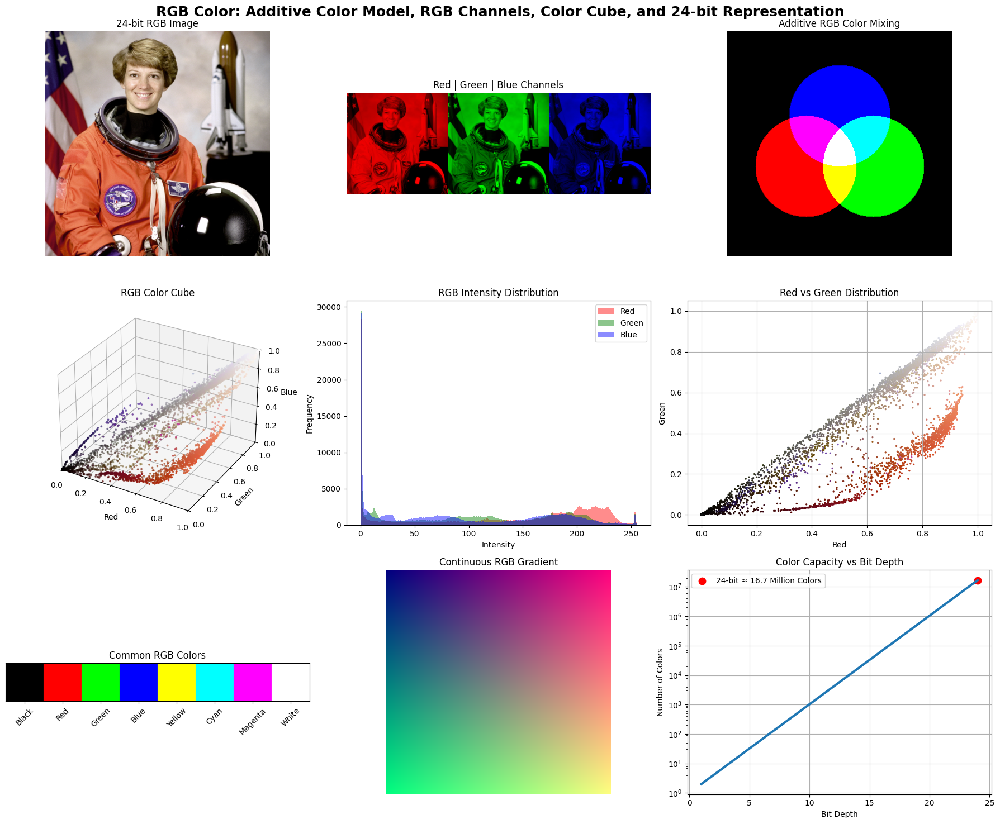

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from skimage import data

# Load Built-in RGB Image
image = data.astronaut()
rgb = image.astype(np.float32) / 255.0

# RGB Channel Separation
R = np.zeros_like(rgb)
G = np.zeros_like(rgb)
B = np.zeros_like(rgb)

R[:, :, 0] = rgb[:, :, 0]
G[:, :, 1] = rgb[:, :, 1]
B[:, :, 2] = rgb[:, :, 2]

# Random Pixel Samples for RGB Cube
pixels = rgb.reshape(-1, 3)

np.random.seed(42)

samples = pixels[
    np.random.choice(
        pixels.shape[0],
        5000,
        replace=False
    )
]

# Additive RGB Color Mixing
size = 400

canvas = np.zeros((size, size, 3))

y, x = np.ogrid[:size, :size]

radius = 90

red = (x - 140) ** 2 + (y - 240) ** 2 <= radius ** 2
green = (x - 260) ** 2 + (y - 240) ** 2 <= radius ** 2
blue = (x - 200) ** 2 + (y - 150) ** 2 <= radius ** 2

canvas[:, :, 0] += red
canvas[:, :, 1] += green
canvas[:, :, 2] += blue

canvas = np.clip(canvas, 0, 1)

# Common RGB Colors
colors = [
    (0, 0, 0),
    (1, 0, 0),
    (0, 1, 0),
    (0, 0, 1),
    (1, 1, 0),
    (0, 1, 1),
    (1, 0, 1),
    (1, 1, 1)
]

labels = [
    "Black",
    "Red",
    "Green",
    "Blue",
    "Yellow",
    "Cyan",
    "Magenta",
    "White"
]

patch_height = 120
patch_width = 120

rgb_chart = np.zeros(
    (
        patch_height,
        patch_width * len(colors),
        3
    )
)

for i, color in enumerate(colors):

    rgb_chart[
        :,
        i * patch_width:(i + 1) * patch_width,
        :
    ] = color

# Figure
fig = plt.figure(figsize=(18, 15))

# Original RGB Image
ax1 = plt.subplot(3, 3, 1)

ax1.imshow(rgb)

ax1.set_title("24-bit RGB Image")

ax1.axis("off")

# RGB Channels
ax2 = plt.subplot(3, 3, 2)

ax2.imshow(np.hstack((R, G, B)))
ax2.set_title("Red | Green | Blue Channels")
ax2.axis("off")

# Additive Color Mixing
ax3 = plt.subplot(3, 3, 3)
ax3.imshow(canvas)
ax3.set_title("Additive RGB Color Mixing")
ax3.axis("off")

# RGB Color Cube
ax4 = fig.add_subplot(3, 3, 4, projection="3d")
ax4.scatter(
    samples[:, 0],
    samples[:, 1],
    samples[:, 2],
    c=samples,
    s=3
)

ax4.set_xlim(0, 1)
ax4.set_ylim(0, 1)
ax4.set_zlim(0, 1)

ax4.set_xlabel("Red")
ax4.set_ylabel("Green")
ax4.set_zlabel("Blue")

ax4.set_title("RGB Color Cube")

# RGB Histograms
ax5 = plt.subplot(3, 3, 5)

for i, c in enumerate(["red", "green", "blue"]):

    ax5.hist(
        image[:, :, i].ravel(),
        bins=256,
        alpha=0.45,
        color=c,
        label=c.capitalize()
    )

ax5.set_title("RGB Intensity Distribution")
ax5.set_xlabel("Intensity")
ax5.set_ylabel("Frequency")
ax5.legend()

# Red vs Green Scatter
ax6 = plt.subplot(3, 3, 6)
ax6.scatter(
    samples[:, 0],
    samples[:, 1],
    c=samples,
    s=2
)

ax6.set_title("Red vs Green Distribution")

ax6.set_xlabel("Red")

ax6.set_ylabel("Green")

ax6.grid(True)

# Common RGB Colors
ax7 = plt.subplot(3, 3, 7)

ax7.imshow(rgb_chart)

ax7.set_title("Common RGB Colors")

ax7.set_xticks(
    np.arange(
        patch_width / 2,
        patch_width * len(colors),
        patch_width
    )
)

ax7.set_xticklabels(
    labels,
    rotation=45
)

ax7.set_yticks([])

# Continuous RGB Gradient
ax8 = plt.subplot(3, 3, 8)
gradient = np.zeros((256, 256, 3))
gradient[:, :, 0] = np.linspace(0, 1, 256)
gradient[:, :, 1] = np.linspace(0, 1, 256)[:, None]
gradient[:, :, 2] = 0.5
ax8.imshow(gradient)
ax8.set_title("Continuous RGB Gradient")
ax8.axis("off")

# Color Capacity
ax9 = plt.subplot(3, 3, 9)
bits = np.arange(1, 25)
colors_available = 2 ** bits
ax9.semilogy(
    bits,
    colors_available,
    linewidth=3
)

ax9.scatter(
    24,
    2 ** 24,
    color="red",
    s=80,
    label="24-bit ≈ 16.7 Million Colors"
)

ax9.set_xlabel("Bit Depth")
ax9.set_ylabel("Number of Colors")
ax9.set_title("Color Capacity vs Bit Depth")
ax9.grid(True)
ax9.legend()

# Figure
plt.suptitle(
    "RGB Color: Additive Color Model, RGB Channels, Color Cube, and 24-bit Representation",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## 3.4 Alpha Compositing

### Definition

Alpha compositing is the process of combining a foreground image with a background image using an alpha (α) value, which controls the transparency of each pixel.

---

## Alpha (α) Value

The alpha value (α) represents the transparency level of a pixel.

- **α = 0**: Fully transparent (background only)  
- **α = 1**: Fully opaque (foreground only)  
- **0 < α < 1**: Partially transparent (foreground and background are blended)  

---

## Alpha Compositing Formula

The final pixel color is calculated as:

$
C = \alpha C_f + (1 - \alpha) C_b
$

Where:

- **C** = Final (composited) color  
- **C_f** = Foreground color  
- **C_b** = Background color  
- **α** = Transparency value  

---

## Alpha Channel

An alpha channel is an additional image channel that stores transparency information.

- **RGB Image**: Stores Red, Green, and Blue values  
- **RGBA Image**: Stores Red, Green, Blue, and Alpha (transparency)  

---

## Applications

- Transparent objects (glass, water)  
- Image editing and photo compositing  
- Video and animation effects  
- Computer games and graphical user interfaces (GUIs)  

---

## 3.4.1 Image Storage

### Definition

Image storage refers to saving digital images in file formats that may use lossless or lossy compression to reduce file size.

---

## Types of Compression

- **Lossless Compression**: No image information is lost  
- **Lossy Compression**: Some image information is discarded to reduce file size  

---

## Common Image Formats

| Format        | Compression | Common Use                          |
|--------------|------------|-------------------------------------|
| JPEG (.jpg)  | Lossy      | Photographs                         |
| PNG (.png)   | Lossless   | Graphics with transparency          |
| TIFF (.tiff) | Lossless   | Professional imaging                |
| PPM (.ppm)   | Uncompressed | Graphics programming and education |

---

## Key Points

- Alpha compositing blends foreground and background images  
- The alpha value (α) controls pixel transparency  
- RGBA images include an alpha channel for transparency  
- Images are commonly stored using JPEG, PNG, TIFF, or PPM formats  
- Image compression can be lossless or lossy depending on the application  

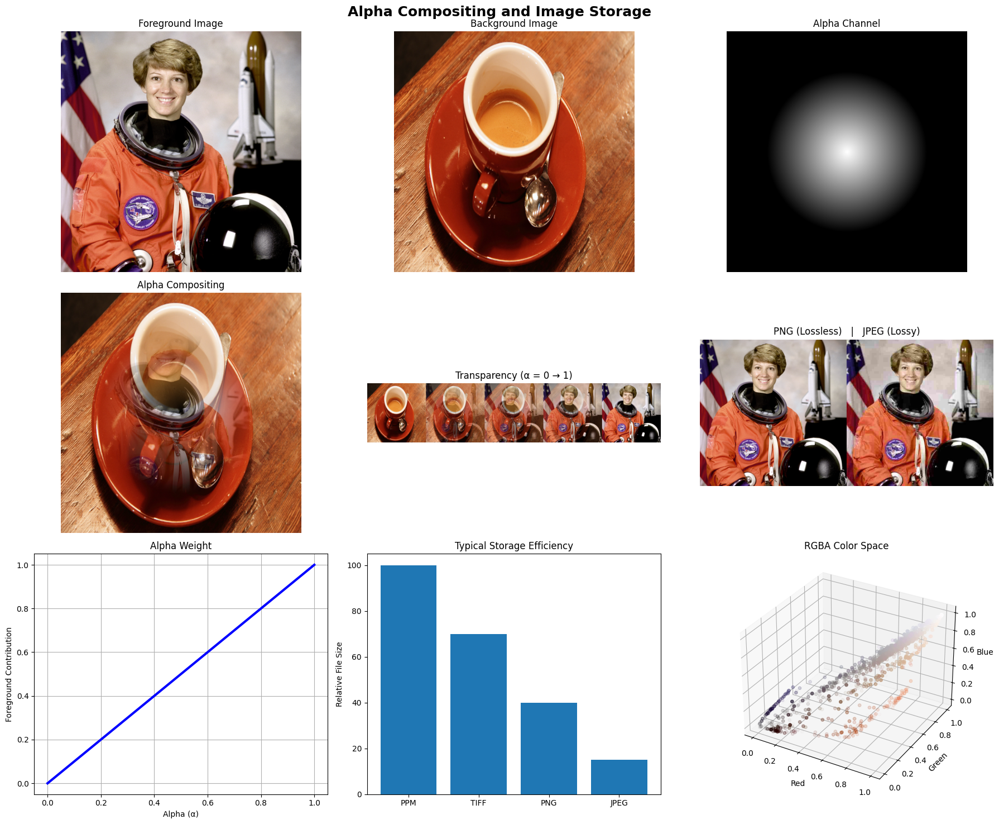

In [ ]:
import io
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
from skimage import data

# Load Built-in Images
foreground = data.astronaut().astype(np.float32) / 255
background = data.coffee().astype(np.float32) / 255

# Resize background to match foreground
background = np.array(
    Image.fromarray((background * 255).astype(np.uint8)).resize(
        (foreground.shape[1], foreground.shape[0])
    )
).astype(np.float32) / 255

# Alpha Channel
# Circular transparency mask
# ------------------------------------------------------------------
h, w = foreground.shape[:2]
y, x = np.ogrid[:h, :w]
cx = w / 2
cy = h / 2
radius = min(h, w) / 3
distance = np.sqrt((x - cx) ** 2 + (y - cy) ** 2)
alpha = np.clip(1 - distance / radius, 0, 1)

# Alpha Compositing
# C = αCf + (1-α)Cb
# -------------------------------------------
composite = (
    alpha[..., None] * foreground +
    (1 - alpha[..., None]) * background
)

# Alpha Levels
alpha0 = background
alpha25 = 0.25 * foreground + 0.75 * background
alpha50 = 0.50 * foreground + 0.50 * background
alpha75 = 0.75 * foreground + 0.25 * background
alpha100 = foreground

# JPEG Compression Simulation
buffer = io.BytesIO()
Image.fromarray(
    (foreground * 255).astype(np.uint8)
).save(
    buffer,
    format="JPEG",
    quality=15
)

buffer.seek(0)
jpeg = np.array(Image.open(buffer)).astype(np.float32) / 255

# PNG Simulation
png = foreground.copy()

# Figure
fig = plt.figure(figsize=(18,15))

# Foreground
ax1 = plt.subplot(3,3,1)
ax1.imshow(foreground)
ax1.set_title("Foreground Image")
ax1.axis("off")

# Background
ax2 = plt.subplot(3,3,2)
ax2.imshow(background)
ax2.set_title("Background Image")
ax2.axis("off")

# Alpha Channel
ax3 = plt.subplot(3,3,3)
ax3.imshow(alpha, cmap="gray")
ax3.set_title("Alpha Channel")
ax3.axis("off")

# Alpha Compositing
ax4 = plt.subplot(3,3,4)
ax4.imshow(composite)
ax4.set_title("Alpha Compositing")
ax4.axis("off")

# Alpha Blending Curve
ax5 = plt.subplot(3,3,5)
levels = np.linspace(0,1,5)
blends = np.hstack([
    background,
    alpha25,
    alpha50,
    alpha75,
    foreground
])

ax5.imshow(blends)
ax5.set_title("Transparency (α = 0 → 1)")
ax5.axis("off")

# Compression Comparison
ax6 = plt.subplot(3,3,6)
comparison = np.hstack((png, jpeg))
ax6.imshow(comparison)
ax6.set_title("PNG (Lossless)   |   JPEG (Lossy)")
ax6.axis("off")

# Alpha Transfer Function
ax7 = plt.subplot(3,3,7)
a = np.linspace(0,1,100)
ax7.plot(a,a,color="blue",linewidth=3)
ax7.set_title("Alpha Weight")
ax7.set_xlabel("Alpha (α)")
ax7.set_ylabel("Foreground Contribution")
ax7.grid(True)

# Compression Ratio Illustration
ax8 = plt.subplot(3,3,8)
formats = ["PPM","TIFF","PNG","JPEG"]
sizes = [100,70,40,15]
ax8.bar(formats,sizes)
ax8.set_ylabel("Relative File Size")
ax8.set_title("Typical Storage Efficiency")

# RGBA Representation
ax9 = fig.add_subplot(3,3,9,projection="3d")
sample = foreground[::8,::8].reshape(-1,3)
alpha_sample = alpha[::8,::8].ravel()
ax9.scatter(
    sample[:,0],
    sample[:,1],
    sample[:,2],
    c=sample,
    s=15,
    alpha=alpha_sample
)

ax9.set_xlabel("Red")
ax9.set_ylabel("Green")
ax9.set_zlabel("Blue")
ax9.set_title("RGBA Color Space")

# Figure
plt.suptitle(
    "Alpha Compositing and Image Storage",
    fontsize=18,
    fontweight="bold"
)

plt.tight_layout()
plt.show()

## Exercise

Simulate an image acquired from the Bayer mosaic by taking a natural image (preferably a scanned photo rather than a digital photo where the Bayer mosaic may already have been applied) and creating a grayscale image composed of interleaved red/green/blue channels. This simulates the raw output of a digital camera. Now create a true RGB image from that output and compare with the original.